# TRABAJO MODELO CLASIFICACION Y OPTIMIZACION HIPERPARAMETROS 

Este trabajo nace como una práctica que tuve que realizar en la asignatura Visión por Computador de 4º de Ingeniería de Software.

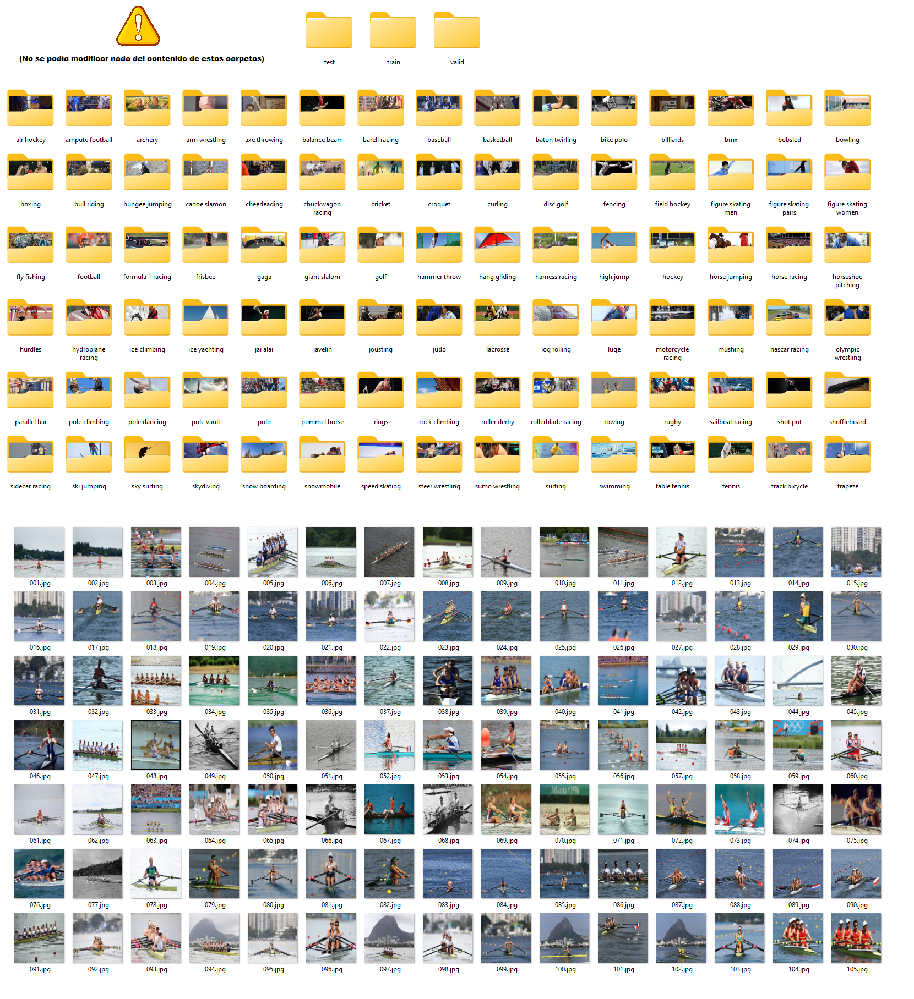

El profesor nos proporcionó un dataset muy extenso ordenado por carpetas, en el que se diferenciaban distintas disciplinas deportivas (más de 100 carpetas de deportes). Las normas eran claras: NO SE PODÍA MODIFICAR NADA DEL DATASET, ni la estructura de carpetas ni las imágenes dentro de las mismas.

Uno de los principales objetivos de la práctica era valorar el correcto preprocesado de las imágenes usando Python:
   - Abrir imágenes con diferentes resoluciones, canales, formas...
   - Data augmentation
   - Aplicación de filtros para el correcto tratamiento de las imágenes
   - Aplicación de optimización de hiperparámetros con Optuna

Otra de las normas era que la clasificación tenía que ser multi-label, dejando libre elección de cuáles serían estas etiquetas, pero siempre cumpliendo las dos normas anteriores:
   - No poder modificar la estructura de carpetas.
   - No poder modificar el nombre de las imágenes ni nada del contenido de los archivos.
   - Tampoco se podía hacer Fine-Tuning a modelos ya conocidos de la comunidad.

Finalmente, competimos con el resto de la clase por el modelo más optimizado posible. Dentro de la categoría de multi-label, este modelo fue el más óptimo.

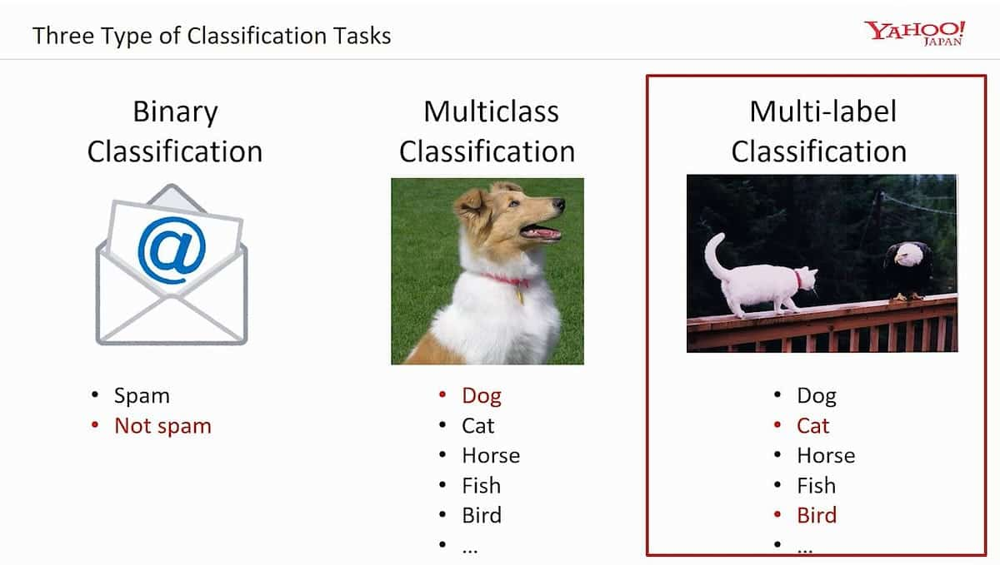

Para terminar dado que teníamos que hacer un multi_label utilizamos como base los 100 deportes:
    - baloncesto
    - futbol
    - tenis
    - water polo ....

Añadimos 8 etiquetas nuevas para poner a las diferentes disciplinas diferenciándolas por:
    - deportes_con_pelota_redonda 
    - deportes_con_pelota_no_redonda 
    - deportes_con_vehiculos 
    - deportes_con_animales 
    - deportes_acuaticos
    - deportes_en_mesa 
    - deportes_acrobaticos
    - deportes_fuerza 



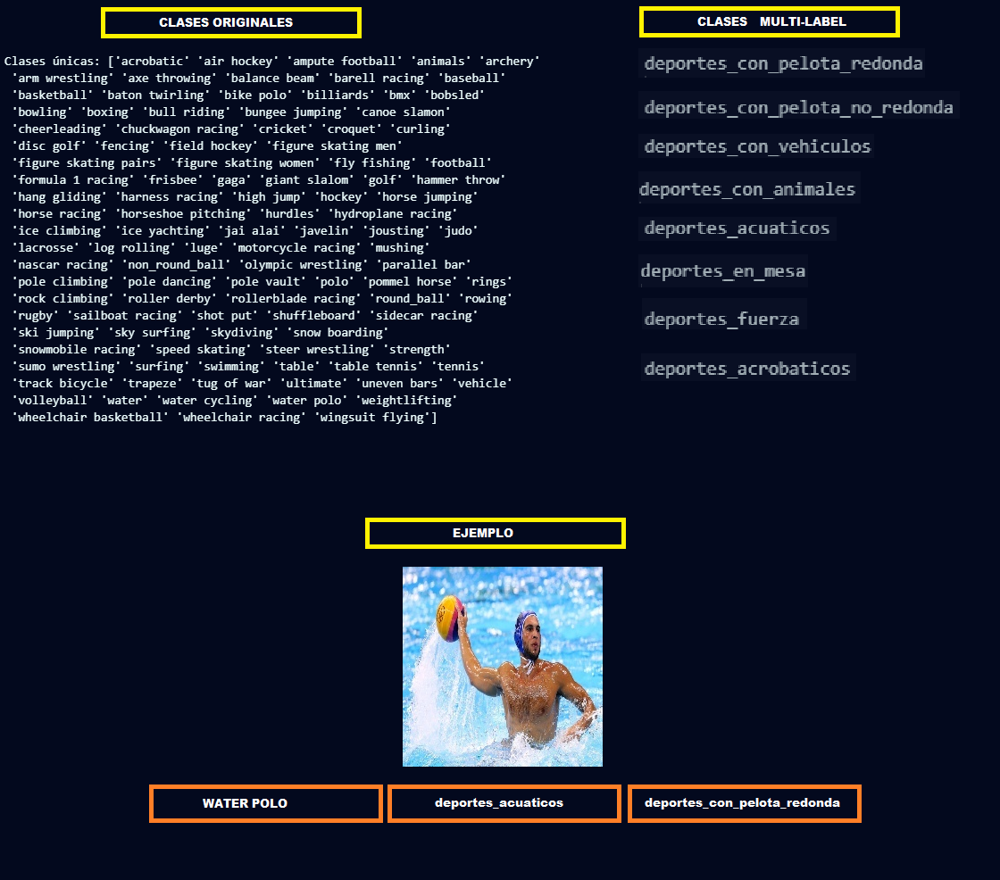

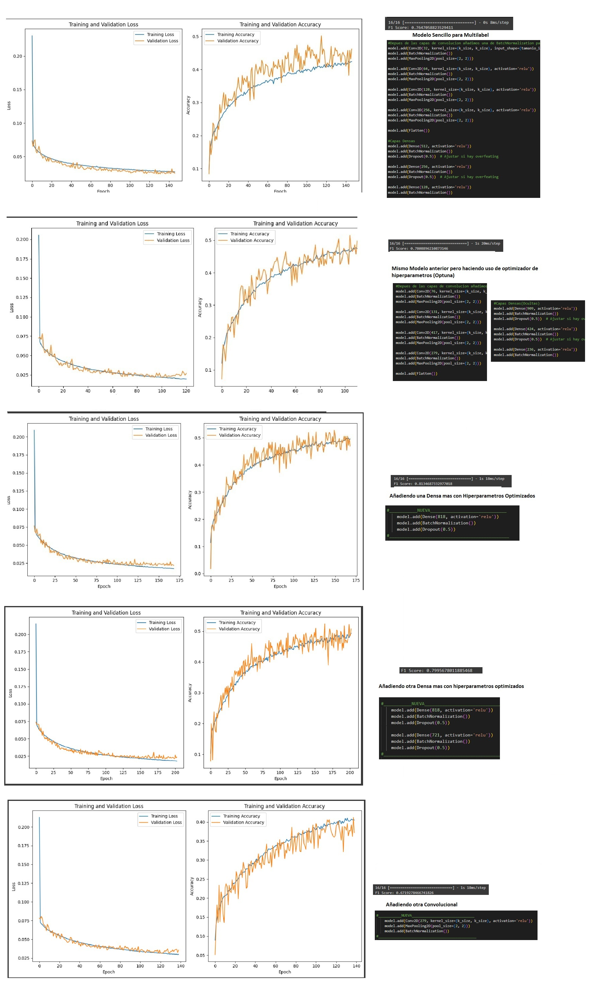

In [ ]:
from google.colab import drive
import os
import zipfile
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import cv2
import numpy as np
from tensorflow.keras import models, layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, BatchNormalization, MaxPooling2D, Dropout, Flatten, Dense
import tensorflow as tf
from sklearn.metrics import f1_score,accuracy_score
from PIL import Image
import random

In [ ]:
drive.mount('/content/drive')

if os.path.exists('drive/MyDrive/Sports.zip'):
    print("La ruta existe")
else:
    print("La ruta no existe")

Mounted at /content/drive
La ruta existe


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sat Nov 25 19:00:48 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 54.8 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
with zipfile.ZipFile('drive/MyDrive/Sports.zip', 'r') as zip_ref:
    zip_ref.extractall('Sports_Imagenes')

print("El directorio actual es:", os.getcwd())

El directorio actual es: /content


## Cargamos las Imagenes

In [ ]:
def cargar_dataset(ruta,tamanio_imagen):
    datos = []
    etiquetas = []

    deportes_con_pelota_redonda = [
        "wheelchair basketball",
        "frisbee",
        "ampute football",
        "golf",
        "gaga",
        "bowling",
        "football",
        "baseball",
        "basketball",
        "bike polo",
        "volleyball",
        "table tennis",
        "baseball",
        "croquet",
        "water polo",
        "field hockey",
        "cricket",
        "croquet",
        "tennis",
        "field hockey",
        "hammer throw",
        'jai alai',
        "shot put",
    ]

    deportes_con_pelota_no_redonda = [
        "ultimate",
        "rugby",
        "baton twirling",
        "hockey",
        "axe throwing",
        "boton twirling",
        "curling",
        "disc golf",
        "frisbee",
        "lacrosse",
    ]

    deportes_con_vehiculos = [
        "formula 1 racing",
        "wheelchair racing",
        "bike polo",
        "hydroplane racing",
        "nascar racing",
        "motorcycle racing",
        "snowmobile racing",
        "sailboat racing"
        "sidecar racing",
        "ice yachting",
        "bmx",
        "bobsled",
        "luge",
        "snowmobile racing",
        "track bicycle",
        "hang gliding",
    ]

    deportes_con_animales = [
        'horse jumping',
        'jousting',
        'canoe slamon',
        'horse racing',
        'barell racing',
        'bull riding',
        'chuckwagon racing',
        'polo',
        'fly fishing',
        "harness racing",
        "jousting",
        "mushing",
        "steer wrestling",
        "barell racing",
        "bull riding",
    ]

    deportes_acuaticos = [
        "hydroplane racing",
        "surfing",
        "swimming",
        "canoe slamon",
        "rowing",
        "water cycling",
        "ice yachting",
        "water polo",
        "sailboat racing",
        "log rolling",
        "rowing",
        "canoe slamon",
    ]

    deportes_en_mesa = [
        "table tennis",
        "shuffleboard",
        "air hockey",
        "gaga",
        "billiard"
    ]
    deportes_acrobaticos = [
        "balance beam",
        "cheerleading",
        "figure skating men",
        "figure skating pairs",
        "figure skating women",
        "parallel bar",
        "pole dancing",
        "pole climbing",
        "pommel horse",
        "rings",
        "trapeze",
        "uneven bars",
        "high jump",
        "pole vault",
        "ski jumping",
        "skydiving",
        "snow boarding"
    ]

    deportes_fuerza = [
        "arm wrestling",
        "boxing",
        "judo",
        "olympic wrestling",
        "sumo wrestling",
        "weightlifting",
    ]


    for categoria in os.listdir(ruta):
        categoria_ruta = os.path.join(ruta, categoria)
        if os.path.isdir(categoria_ruta):
            for imagen_nombre in os.listdir(categoria_ruta):
                imagen_ruta = os.path.join(categoria_ruta, imagen_nombre)
                try:
                    # Verificar si es un archivo y si es una imagen reconocida
                    if os.path.isfile(imagen_ruta) and any(imagen_ruta.lower().endswith(ext) for ext in ['.png', '.jpg', '.jpeg']):
                        imagen = Image.open(imagen_ruta).resize(tamanio_imagen)
                        if len(np.array(imagen).shape) == 2:
                            imagen = cv2.cvtColor(np.array(imagen), cv2.COLOR_GRAY2RGB)
                        datos.append(np.array(imagen).reshape(tamanio_imagen[0], tamanio_imagen[1], 3))

                        # Asignar etiquetas según la carpeta actual
                        etiqueta_actual = [categoria]

                        if categoria in deportes_con_pelota_redonda:
                            etiqueta_actual.append("round_ball")
                        if categoria in deportes_con_pelota_no_redonda:
                            etiqueta_actual.append("non_round_ball")
                        if categoria in deportes_con_vehiculos:
                            etiqueta_actual.append("vehicle")
                        if categoria in deportes_con_animales:
                            etiqueta_actual.append("animals")
                        if categoria in deportes_acuaticos:
                            etiqueta_actual.append("water")
                        if categoria in deportes_en_mesa:
                            etiqueta_actual.append("table")
                        if categoria in deportes_acrobaticos:
                            etiqueta_actual.append("acrobatic")
                        if categoria in deportes_fuerza:
                            etiqueta_actual.append("strength")

                        etiquetas.append(etiqueta_actual)
                        print(f"Img {imagen_ruta} , Categorias {etiquetas[-1]}")
                except Exception as e:
                    print(f"Error al procesar {imagen_ruta}: {e}")

    return np.array(datos), etiquetas

In [ ]:
X_train, Y_train = cargar_dataset("/content/Sports_Imagenes/Sports/train",(128, 128))
X_test, Y_test = cargar_dataset("/content/Sports_Imagenes/Sports/test",(128, 128))
X_valid, Y_valid = cargar_dataset("/content/Sports_Imagenes/Sports/valid",(128, 128))

print(f"Tamaño X_train: {len(X_train)} - Tamaño Y_train: {len(Y_train)}")
print(f"Tamaño X_test: {len(X_test)} - Tamaño Y_test: {len(Y_test)}")
print(f"Tamaño X_valid: {len(X_valid)} - Tamaño Y_valid: {len(Y_valid)}")

Se han truncado las últimas 5000 líneas del flujo de salida.
Img /content/Sports_Imagenes/Sports/train/cricket/040.jpg , Categorias ['cricket', 'round_ball']
Img /content/Sports_Imagenes/Sports/train/cricket/062.jpg , Categorias ['cricket', 'round_ball']
Img /content/Sports_Imagenes/Sports/train/cricket/047.jpg , Categorias ['cricket', 'round_ball']
Img /content/Sports_Imagenes/Sports/train/cricket/100.jpg , Categorias ['cricket', 'round_ball']
Img /content/Sports_Imagenes/Sports/train/cricket/079.jpg , Categorias ['cricket', 'round_ball']
Img /content/Sports_Imagenes/Sports/train/cricket/067.jpg , Categorias ['cricket', 'round_ball']
Img /content/Sports_Imagenes/Sports/train/cricket/052.jpg , Categorias ['cricket', 'round_ball']
Img /content/Sports_Imagenes/Sports/train/cricket/036.jpg , Categorias ['cricket', 'round_ball']
Img /content/Sports_Imagenes/Sports/train/cricket/117.jpg , Categorias ['cricket', 'round_ball']
Img /content/Sports_Imagenes/Sports/train/cricket/085.jpg , Catego

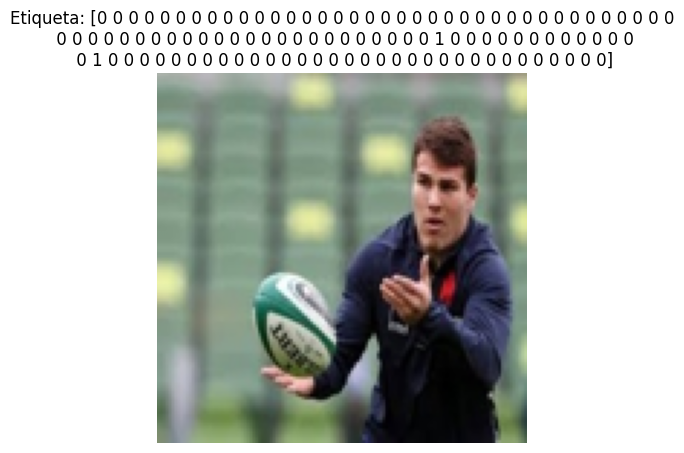

In [ ]:
# Escoge una imagen aleatoria
indice_aleatorio = random.randint(0, len(X_train) - 1)
#indice_aleatorio = 10618

plt.imshow(X_train[indice_aleatorio])
plt.title(f'Etiqueta: {Y_train[indice_aleatorio]}')
plt.axis('off')
plt.show()

## Normalizacion Imagenes

In [ ]:
X_train = np.array(X_train) / 255.0
X_test = np.array(X_test) / 255.0
X_valid = np.array(X_valid) / 255.0

## Normalizacion Etiquetas

In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer

# Inicializar y ajustar el codificador de etiquetas
mlb = MultiLabelBinarizer()
Y_train = mlb.fit_transform(Y_train)
Y_test = mlb.fit_transform(Y_test)
Y_valid = mlb.fit_transform(Y_valid)

# Imprimir las clases únicas
print("Clases únicas:", mlb.classes_)

Clases únicas: ['acrobatic' 'air hockey' 'ampute football' 'animals' 'archery'
 'arm wrestling' 'axe throwing' 'balance beam' 'barell racing' 'baseball'
 'basketball' 'baton twirling' 'bike polo' 'billiards' 'bmx' 'bobsled'
 'bowling' 'boxing' 'bull riding' 'bungee jumping' 'canoe slamon'
 'cheerleading' 'chuckwagon racing' 'cricket' 'croquet' 'curling'
 'disc golf' 'fencing' 'field hockey' 'figure skating men'
 'figure skating pairs' 'figure skating women' 'fly fishing' 'football'
 'formula 1 racing' 'frisbee' 'gaga' 'giant slalom' 'golf' 'hammer throw'
 'hang gliding' 'harness racing' 'high jump' 'hockey' 'horse jumping'
 'horse racing' 'horseshoe pitching' 'hurdles' 'hydroplane racing'
 'ice climbing' 'ice yachting' 'jai alai' 'javelin' 'jousting' 'judo'
 'lacrosse' 'log rolling' 'luge' 'motorcycle racing' 'mushing'
 'nascar racing' 'non_round_ball' 'olympic wrestling' 'parallel bar'
 'pole climbing' 'pole dancing' 'pole vault' 'polo' 'pommel horse' 'rings'
 'rock climbing' 'roller 

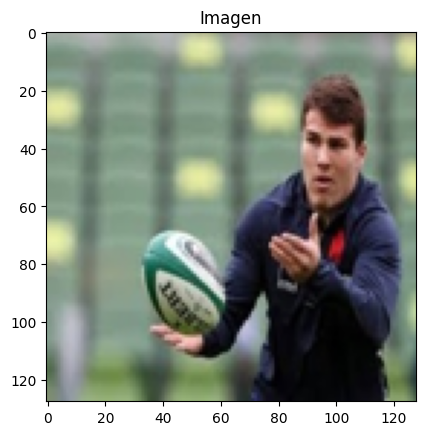

Etiqueta binaria:
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [ ]:
# Mostrar la imagen
plt.imshow(X_train[indice_aleatorio])
plt.title("Imagen")
plt.show()

# Mostrar la representación binaria correspondiente
print("Etiqueta binaria:")
print(Y_train[indice_aleatorio])

## Creacion Modelo

# Data Augmentation

In [ ]:
from tensorflow.keras.layers.experimental import preprocessing
IMG_SIZE = 128

data_augmentation = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
    tf.keras.layers.experimental.preprocessing.RandomZoom(0.2),
    tf.keras.layers.experimental.preprocessing.RandomTranslation(0.2, 0.2),
    tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),

    preprocessing.RandomContrast(0.2),  # Ajusta el contraste
])

## PRIMER MODELO 0.76

In [ ]:
def construir_modelo(tamanio_imagen, k_size):
    model = Sequential()

    # Capas de aumento de datos y redimensionamiento
    model.add(data_augmentation)

    #Depues de las capas de convolucion añadimos una de BatchNormalization para estabilizar y acelerar el entrenamiento
    model.add(Conv2D(32, kernel_size=(k_size, k_size), input_shape=(tamanio_imagen, tamanio_imagen, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(64, kernel_size=(k_size, k_size), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(128, kernel_size=(k_size, k_size), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(256, kernel_size=(k_size, k_size), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Flatten())

    #Capas Densas
    model.add(Dense(512, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))  # Ajustar si hay overfeating

    model.add(Dense(256, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))  # Ajustar si hay overfeating

    model.add(Dense(128, activation='relu'))
    model.add(BatchNormalization())

    #Capa Salida
    model.add(Dense(len(mlb.classes_), activation='sigmoid'))  # len(mlb.classes_) es el número de clases

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model

## Segundo Modelo 0.78

In [ ]:
def construir_modelo(tamanio_imagen, k_size):
    model = Sequential()

    # Capas de aumento de datos y redimensionamiento
    model.add(data_augmentation)

    #Depues de las capas de convolucion añadimos una de BatchNormalization para estabilizar y acelerar el entrenamiento
    model.add(Conv2D(76, kernel_size=(k_size, k_size), input_shape=(tamanio_imagen, tamanio_imagen, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(131, kernel_size=(k_size, k_size), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(417, kernel_size=(k_size, k_size), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(279, kernel_size=(k_size, k_size), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Flatten())

    #Capas Densas(Ocultas)
    model.add(Dense(909, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))  # Ajustar si hay overfeating

    model.add(Dense(424, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))  # Ajustar si hay overfeating

    model.add(Dense(236, activation='relu'))
    model.add(BatchNormalization())

    #Capa Salida
    model.add(Dense(len(mlb.classes_), activation='sigmoid'))  # len(mlb.classes_) es el número de clases

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model

## Prueba Nueva

In [ ]:
def construir_modelo(tamanio_imagen, k_size):
    model = Sequential()

    # Capas de aumento de datos y redimensionamiento
    model.add(data_augmentation)

    #Depues de las capas de convolucion añadimos una de BatchNormalization para estabilizar y acelerar el entrenamiento
    model.add(Conv2D(76, kernel_size=(k_size, k_size), input_shape=(tamanio_imagen, tamanio_imagen, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(BatchNormalization())


    model.add(Conv2D(131, kernel_size=(k_size, k_size), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(BatchNormalization())

    model.add(Conv2D(417, kernel_size=(k_size, k_size), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(BatchNormalization())

    model.add(Conv2D(279, kernel_size=(k_size, k_size), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(BatchNormalization())

    model.add(Flatten())

    #Capas Densas(Ocultas)
    model.add(Dense(909, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))  # Ajustar si hay overfeating

    #___________NUEVA_______________
    model.add(Dense(909, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))  # Ajustar si hay overfeating

    model.add(Dense(424, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))  # Ajustar si hay overfeating

    model.add(Dense(236, activation='relu'))
    model.add(BatchNormalization())

    #Capa Salida
    model.add(Dense(len(mlb.classes_), activation='sigmoid'))  # len(mlb.classes_) es el número de clases

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model

In [ ]:
modelo = construir_modelo(tamanio_imagen=128, k_size=3)
modelo.build((None, 128, 128, 3))  # Ajusta las dimensiones según tu caso
modelo.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 128, 128, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 126, 126, 76)      2128      
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 76)        0         
 D)                                                              
                                                                 
 batch_normalization (Batch  (None, 63, 63, 76)        304       
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 131)       89735     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 131)      

## Uso de Optimizadores

In [ ]:
def construir_modelo(tamanio_imagen, k_size, filtros1, filtros2, filtros3, filtros4 , dense_units1 ,dense_units2, dense_units3):
    model = Sequential()

    # Capas de aumento de datos y redimensionamiento
    model.add(data_augmentation)

    # Depues de las capas de convolucion añadimos una de BatchNormalization para estabilizar y acelerar el entrenamiento
    model.add(Conv2D(filtros1, kernel_size=(k_size, k_size), input_shape=(tamanio_imagen, tamanio_imagen, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(filtros2, kernel_size=(k_size, k_size), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(filtros3, kernel_size=(k_size, k_size), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(filtros4, kernel_size=(k_size, k_size), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Flatten())

    # Capas Densas(Oculatas)
    model.add(Dense(dense_units1, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))  # Ajustar si hay sobreajuste

    model.add(Dense(dense_units2, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))  # Ajustar si hay sobreajuste

    model.add(Dense(dense_units3, activation='relu'))
    model.add(BatchNormalization())

    # Capa Salida
    model.add(Dense(len(mlb.classes_), activation='sigmoid'))  # len(mlb.classes_) es el número de clases

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint
import optuna

def objetivo(trial):
    # Define la función objetivo con los hiperparámetros a optimizar
    model = construir_modelo(
        tamanio_imagen=128,
        k_size=3,
        filtros1=trial.suggest_int('filtros1', 32, 128),
        filtros2=trial.suggest_int('filtros2', 64, 256),
        filtros3=trial.suggest_int('filtros3', 128, 512),
        filtros4=trial.suggest_int('filtros4', 256, 512),
        dense_units1=trial.suggest_int('dense_units1', 512, 1024),
        dense_units2=trial.suggest_int('dense_units2', 256, 512),
        dense_units3=trial.suggest_int('dense_units3', 128, 512),
    )

    # Guardar el mejor modelo durante el entrenamiento
    checkpoint = ModelCheckpoint('mejor_modelo.h5', monitor='val_accuracy', save_best_only=True, mode='max')

    # Entrena y evalúa el modelo
    history = model.fit(X_train, Y_train, epochs=30, validation_data=(X_valid, Y_valid), callbacks=[checkpoint], verbose=3)
    accuracy = max(history.history['val_accuracy'])  # Toma la máxima precisión en el conjunto de validación

    # Devuelve la métrica que deseas optimizar (puede ser precisión, F1-score, etc.)
    return accuracy


In [ ]:
# Crea el objeto study
study = optuna.create_study(direction='maximize')

# Ejecuta la optimización
study.optimize(objetivo, n_trials=10)  # Puedes ajustar el número de trials según sea necesario

# Después de que la optimización haya finalizado
mejor_modelo_y_resultados = study.best_trial.user_attrs['model_info']
mejores_hiperparametros = mejor_modelo_y_resultados['hyperparameters']

In [ ]:
# Imprimir los mejores hiperparámetros
print("Mejores hiperparámetros encontrados:")
print(mejores_hiperparametros)

## ENTRENAMIENTO NORMAL

In [ ]:
#early_stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, verbose=3)
#fit
history = modelo.fit(X_train, Y_train, epochs=1000, validation_data=(X_valid, Y_valid), callbacks=[early_stopping] , shuffle=True)

Epoch 1/1000
422/422 [==============================] - 43s 60ms/step - loss: 0.2092 - accuracy: 0.1143 - val_loss: 0.0769 - val_accuracy: 0.0180
Epoch 2/1000
422/422 [==============================] - 24s 58ms/step - loss: 0.0692 - accuracy: 0.1611 - val_loss: 0.0689 - val_accuracy: 0.1740
Epoch 3/1000
422/422 [==============================] - 25s 59ms/step - loss: 0.0667 - accuracy: 0.1754 - val_loss: 0.0665 - val_accuracy: 0.1800
Epoch 4/1000
422/422 [==============================] - 25s 60ms/step - loss: 0.0641 - accuracy: 0.1903 - val_loss: 0.0727 - val_accuracy: 0.1760
Epoch 5/1000
422/422 [==============================] - 26s 61ms/step - loss: 0.0625 - accuracy: 0.2000 - val_loss: 0.0655 - val_accuracy: 0.1580
Epoch 6/1000
422/422 [==============================] - 25s 60ms/step - loss: 0.0609 - accuracy: 0.2053 - val_loss: 0.0630 - val_accuracy: 0.2320
Epoch 7/1000
422/422 [==============================] - 25s 60ms/step - loss: 0.0596 - accuracy: 0.2126 - val_loss: 0.0641 -

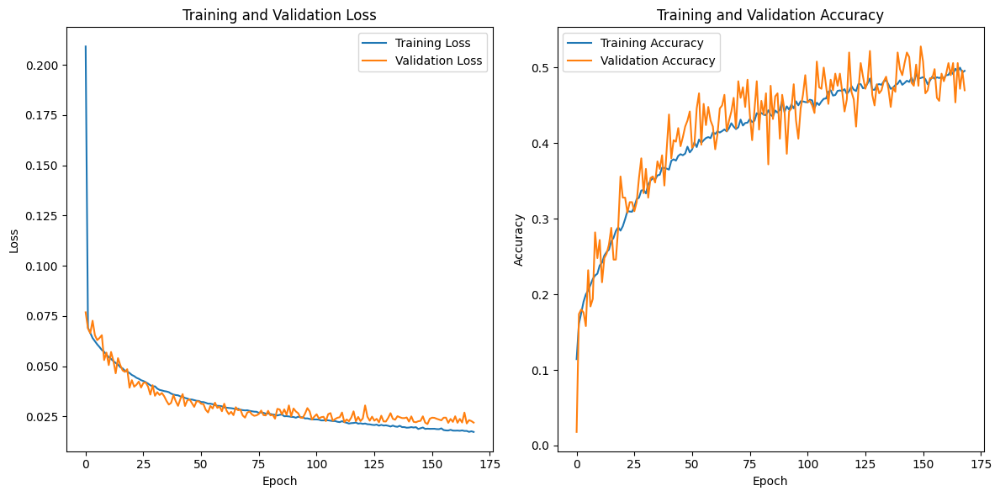

In [ ]:
# Extrae la información de la historia
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Crea subgráficos para la pérdida y la precisión
plt.figure(figsize=(12, 6))

# Gráfico de pérdida
plt.subplot(1, 2, 1)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Gráfico de precisión
plt.subplot(1, 2, 2)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Ajusta el diseño de los subgráficos
plt.tight_layout()

# Muestra los gráficos
plt.show()

16/16 [==============================] - 1s 18ms/step
F1 Score: 0.8134687332977018


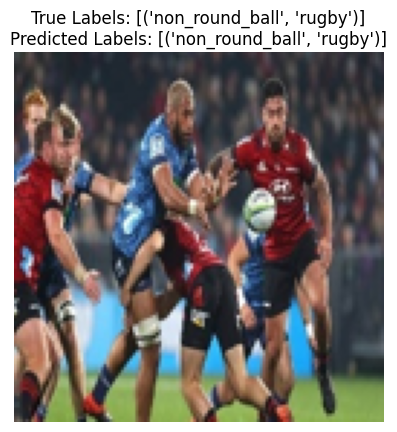

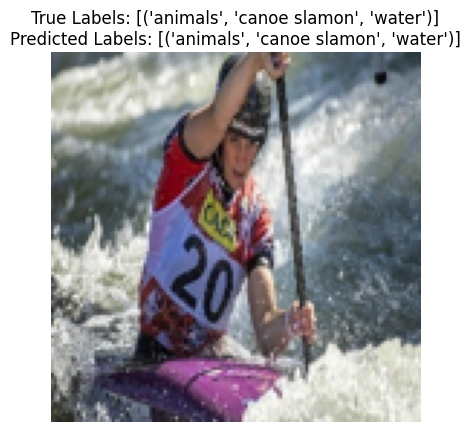

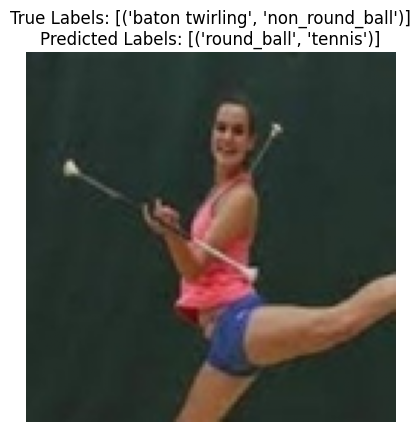

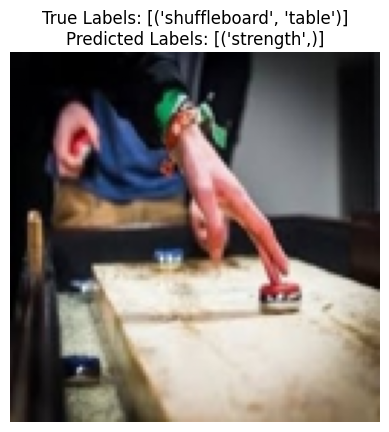

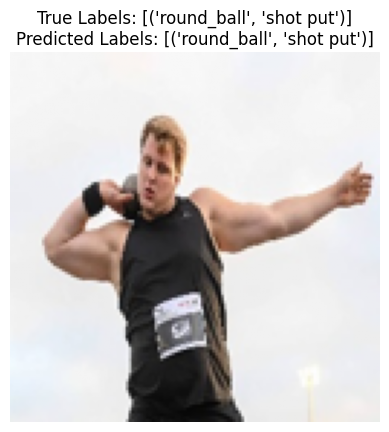

In [ ]:
# Make predictions on the test set
Y_pred = modelo.predict(X_test)

# Thresholding predictions (adjust threshold as needed)
threshold = 0.5
Y_pred_binary = (Y_pred > threshold).astype(int)

# Convert list to NumPy array
Y_test_array = np.array(Y_test)

# Calculate F1 score
f1 = f1_score(Y_test_array, Y_pred_binary, average='micro')
print(f"F1 Score: {f1}")

# Display some random predictions
num_samples = 5
random_indices = np.random.choice(len(X_test), num_samples, replace=False)

for idx in random_indices:
    plt.imshow(X_test[idx])

    # Convert list to NumPy array for inverse_transform
    true_labels = np.array(Y_test[idx]).reshape(1, -1)
    predicted_labels = np.array(Y_pred_binary[idx]).reshape(1, -1)

    plt.title(f"True Labels: {mlb.inverse_transform(true_labels)}\nPredicted Labels: {mlb.inverse_transform(predicted_labels)}")
    plt.axis('off')
    plt.show()


In [ ]:
# Supongamos que 'modelo' es tu modelo ya entrenado
modelo.save('modelo_0_81_.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from sklearn.metrics import  classification_report

# Obtener las predicciones para el conjunto de prueba
y_pred = modelo.predict(X_test)

# Convertir las predicciones de probabilidades a clases (usando umbral de 0.5)
y_pred_classes = (y_pred > 0.5).astype(int)

# Obtener las clases reales del conjunto de prueba
y_true = Y_test

# Imprimir un informe de clasificación
print(classification_report(y_true, y_pred_classes, target_names=mlb.classes_))

16/16 [==============================] - 0s 19ms/step
                       precision    recall  f1-score   support

            acrobatic       0.86      0.87      0.87        85
           air hockey       0.71      1.00      0.83         5
      ampute football       0.80      0.80      0.80         5
              animals       0.93      0.88      0.91        60
              archery       1.00      0.40      0.57         5
        arm wrestling       0.67      0.80      0.73         5
         axe throwing       1.00      0.60      0.75         5
         balance beam       1.00      1.00      1.00         5
        barell racing       0.83      1.00      0.91         5
             baseball       1.00      0.60      0.75         5
           basketball       0.75      0.60      0.67         5
       baton twirling       1.00      0.60      0.75         5
            bike polo       1.00      0.80      0.89         5
            billiards       1.00      1.00      1.00         5


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## LAS PEORES PREDICCIONES

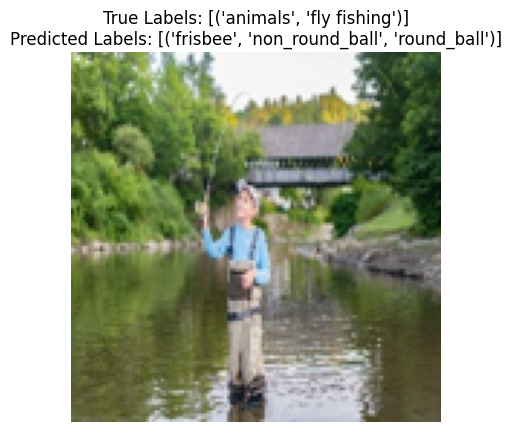

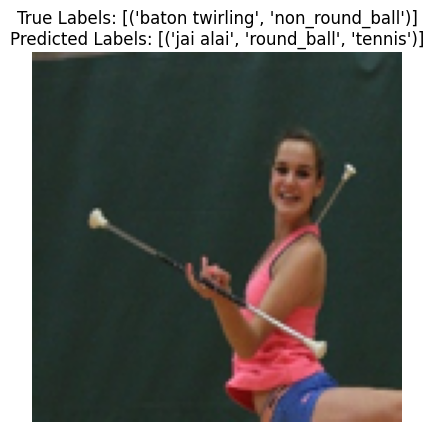

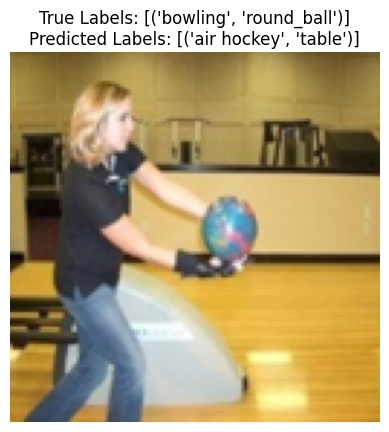

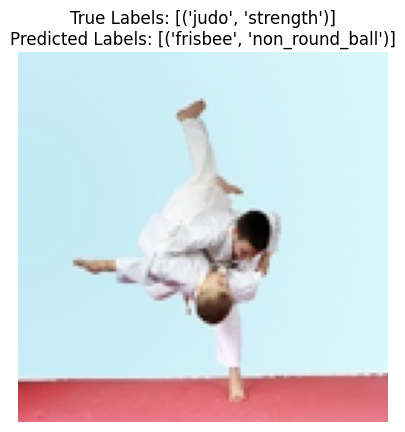

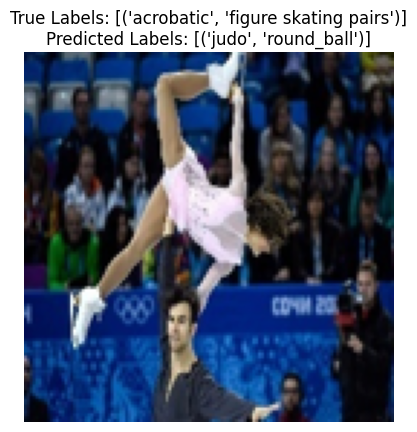

...

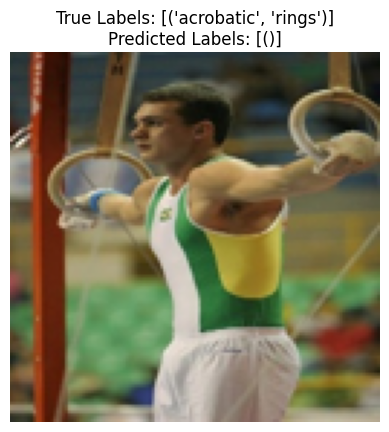

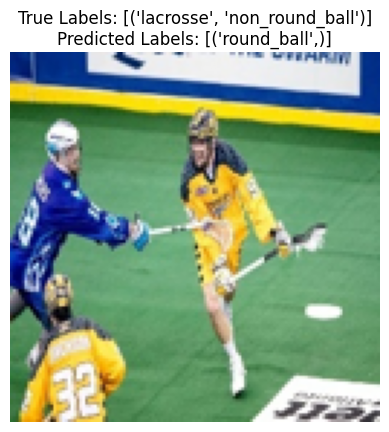

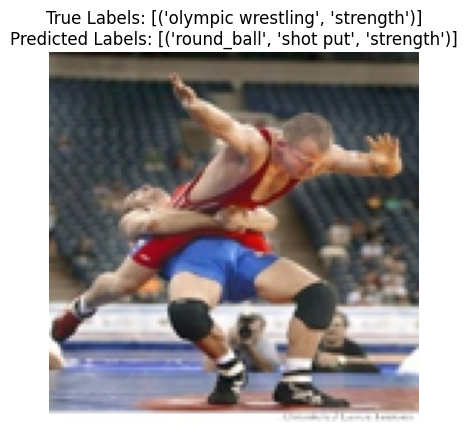

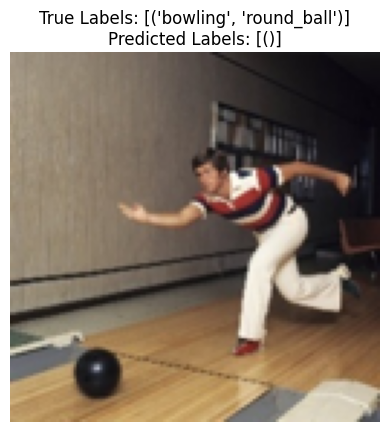

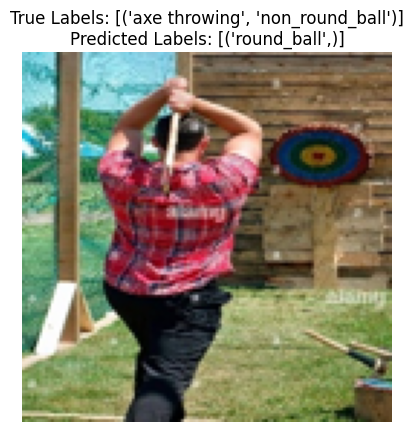

In [ ]:
# Calcular la discrepancia entre las etiquetas reales y las predicciones
discrepancies = np.abs(Y_test - Y_pred)

# Calcular la suma de discrepancias para cada imagen
image_discrepancies = np.sum(discrepancies, axis=1)

# Ordenar índices de imágenes por discrepancia (de mayor a menor)
sorted_indices = np.argsort(image_discrepancies)[::-1]

# Mostrar las 5 imágenes con las peores predicciones
for i in range(20):
    idx = sorted_indices[i]

    # Comprobar si alguna predicción está por debajo del umbral
    if any(pred < display_threshold for pred in Y_pred[idx]):
        plt.imshow(X_test[idx])

        # Convertir listas a matrices NumPy para inverse_transform
        true_labels = np.array(Y_test[idx]).reshape(1, -1)
        predicted_labels = np.array(Y_pred_binary[idx]).reshape(1, -1)

        plt.title(f"True Labels: {mlb.inverse_transform(true_labels)}\nPredicted Labels: {mlb.inverse_transform(predicted_labels)}")
        plt.axis('off')
        plt.show()
